## Imports


In [207]:
%load_ext autoreload
%autoreload 2
#%matplotlib widget

import sys  # update paths
import os  # import os in order to find relative path
import glob
import numpy as np 
import matplotlib.pyplot as plt
import re
import h5py

from collections import Counter

path_to_resfit = '/Users/sph/Library/CloudStorage/GoogleDrive-spharvey3@gmail.com/My Drive/Schuster/Code/Git/scresonators/'
sys.path.append('/Users/sph/Library/CloudStorage/GoogleDrive-spharvey3@gmail.com/My Drive/Schuster/Code/Git')

sys.path.append(path_to_resfit)
from slab.datamanagement import SlabFile

import fit_resonator.resonator as scres


def read_file(filepath, filename):
    readin = np.load(os.path.join(filepath, filename), allow_pickle=True)
    return readin['data'].item()

#import importlib 
#importlib.reload(scres)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [208]:
"""Reopen saved data"""
def prev_data(expt_path, filename):
    temp_data_file = expt_path+'/'+filename
    with SlabFile(temp_data_file) as a:
        attrs = dict()
        for key in list(a.attrs):
            attrs.update({key:json.loads(a.attrs[key])})
        keys = list(a)
        temp_data = dict()
        for key in keys:
            temp_data.update({key:np.array(a[key])})
    return temp_data, attrs

## Grab list of resonators and files

In [209]:
# List of files 
pth_base = '/Users/sph/Library/CloudStorage/GoogleDrive-sphar01@stanford.edu/Shared drives/SLab/JJ_fab/Coherence Sample /Resonators Measurement/coherence res/'
slab = True
if slab: 
    folder = '240514/'
    pattern = r'res_(\d+)_\d{2}dbm'  # Matches a 2-digit number
else: 
    folder = '240511/'
    pattern = r'_res_(\d+)_\d{2}dbm.npz'  # Matches a 2-digit number

pth = pth_base + folder
file_list0 = os.listdir(pth)
#file_list0 = [file for file in file_list0 if file.endswith('.npz')]
print(len(file_list0))

tokens=[]
# Get a list of resonators 
for i in range(len(file_list0)):
    tokens.append(re.findall(pattern, file_list0[i]))

values = [int(token) for sublist in tokens for token in sublist]
resonators = set(values)

frequency = Counter(values)
print(frequency)

resonators = np.array(list(resonators))
resonators.sort()


158
Counter({3181743: 31, 3276372: 30, 3281151: 30, 3273236: 30, 3374038: 28})


## Fit resonator func

In [210]:
def fit_resonator(data, filename, output_path, fit_type='DCM'):
    # fit type DCM, CPZM
    my_resonator = scres.Resonator()
    my_resonator.outputpath = output_path 
    my_resonator.filename = filename
    my_resonator.from_columns(data['freqs'], data['amps'], data['phases'])
    # Set fit parameters

    MC_iteration = 4
    MC_rounds = 1e3
    MC_fix = []
    manual_init = None
    my_resonator.preprocess_method = 'linear' # Preprocess method: default = linear
    my_resonator.filepath = './' # Path to fit output

    # Perform a fit on the data with given parameters
    my_resonator.fit_method(fit_type, MC_iteration, MC_rounds=MC_rounds, MC_fix=MC_fix,manual_init=manual_init, MC_step_const=0.3)
    output = my_resonator.fit('png')
    return output 

# conf_array = [Q_conf, Qi_conf, Qc_conf, Qc_Re_conf, phi_conf, w1_conf]


# Q, Qc, Frequency, Phase 

## Loop for processing R+S data (slab)

['res_3181743_97dbm', 'res_3181743_94dbm', 'res_3181743_91dbm', 'res_3181743_88dbm', 'res_3181743_85dbm', 'res_3181743_82dbm', 'res_3181743_79dbm', 'res_3181743_76dbm', 'res_3181743_73dbm', 'res_3181743_70dbm', 'res_3181743_67dbm', 'res_3181743_64dbm', 'res_3181743_61dbm', 'res_3181743_58dbm', 'res_3181743_55dbm', 'res_3181743_52dbm', 'res_3181743_49dbm', 'res_3181743_46dbm', 'res_3181743_43dbm', 'res_3181743_40dbm', 'res_3181743_37dbm', 'res_3181743_34dbm', 'res_3181743_31dbm', 'res_3181743_30dbm', 'res_3181743_28dbm', 'res_3181743_25dbm', 'res_3181743_22dbm', 'res_3181743_19dbm', 'res_3181743_16dbm', 'res_3181743_13dbm', 'res_3181743_10dbm']


/Users/sph/Library/CloudStorage/GoogleDrive-spharvey3@gmail.com/My Drive/Schuster/Code/Git/scresonators/fit_resonator/plot.py:192: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figurename)#, figsize=(18, 12))


Time elapsed:  19.51717495918274
['res_3273236_97dbm', 'res_3273236_94dbm', 'res_3273236_91dbm', 'res_3273236_88dbm', 'res_3273236_85dbm', 'res_3273236_82dbm', 'res_3273236_79dbm', 'res_3273236_76dbm', 'res_3273236_73dbm', 'res_3273236_70dbm', 'res_3273236_67dbm', 'res_3273236_64dbm', 'res_3273236_61dbm', 'res_3273236_58dbm', 'res_3273236_55dbm', 'res_3273236_52dbm', 'res_3273236_49dbm', 'res_3273236_46dbm', 'res_3273236_43dbm', 'res_3273236_40dbm', 'res_3273236_37dbm', 'res_3273236_34dbm', 'res_3273236_31dbm', 'res_3273236_28dbm', 'res_3273236_25dbm', 'res_3273236_22dbm', 'res_3273236_19dbm', 'res_3273236_16dbm', 'res_3273236_13dbm', 'res_3273236_10dbm']
Time elapsed:  39.12661910057068
['res_3276372_97dbm', 'res_3276372_94dbm', 'res_3276372_91dbm', 'res_3276372_88dbm', 'res_3276372_85dbm', 'res_3276372_82dbm', 'res_3276372_79dbm', 'res_3276372_76dbm', 'res_3276372_73dbm', 'res_3276372_70dbm', 'res_3276372_67dbm', 'res_3276372_64dbm', 'res_3276372_61dbm', 'res_3276372_58dbm', 'res_327

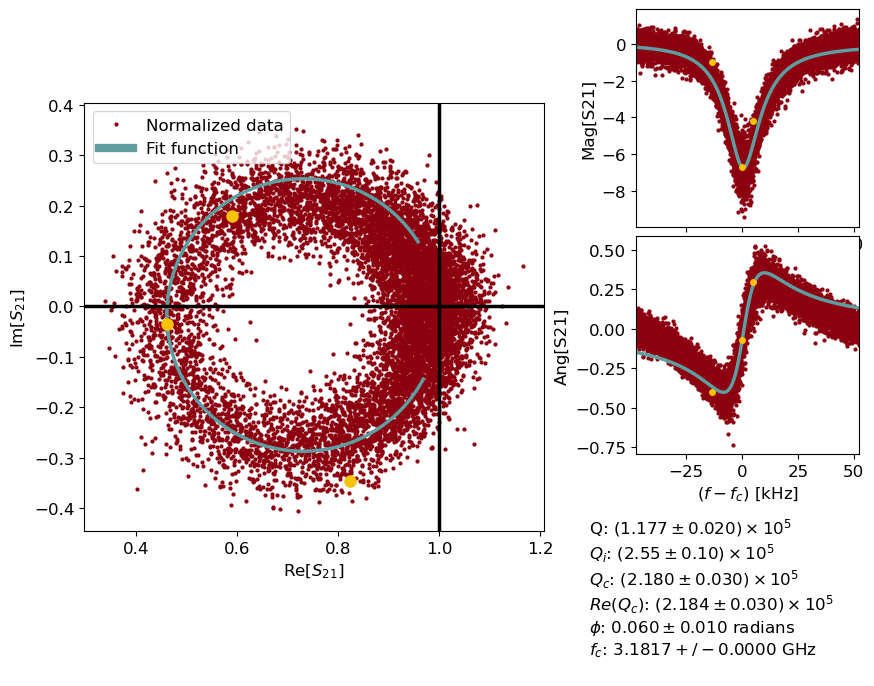

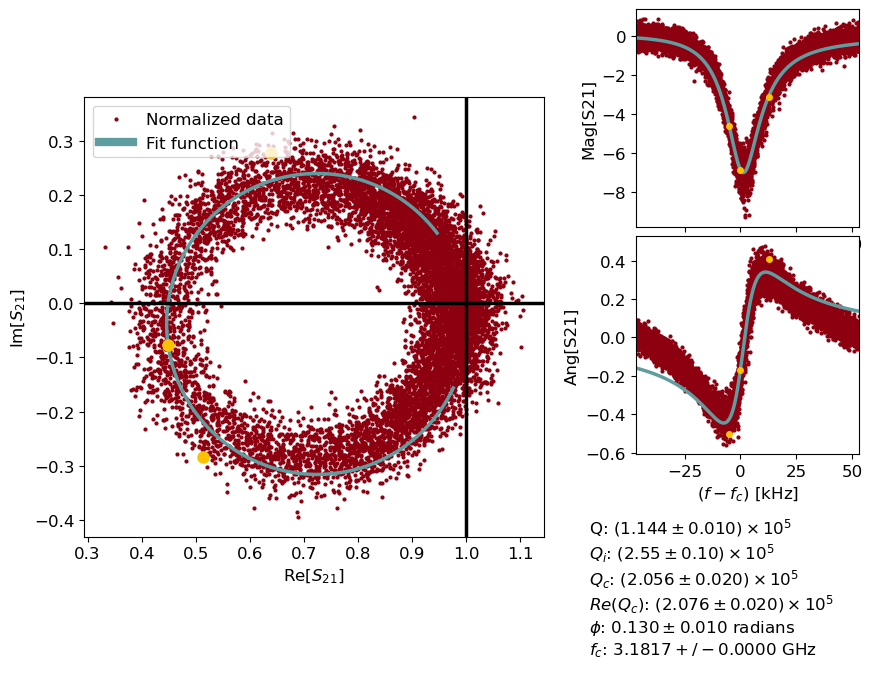

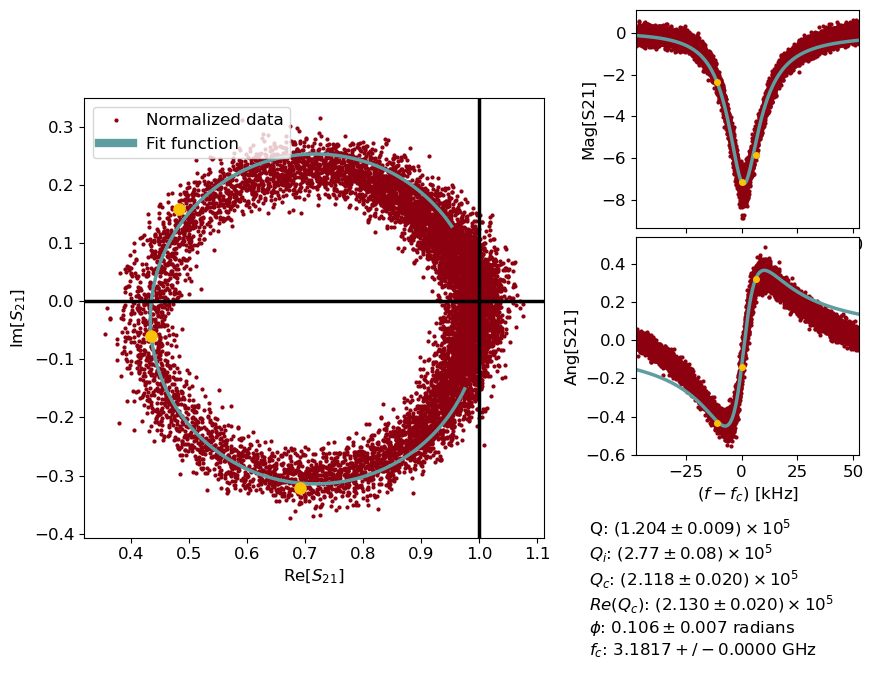

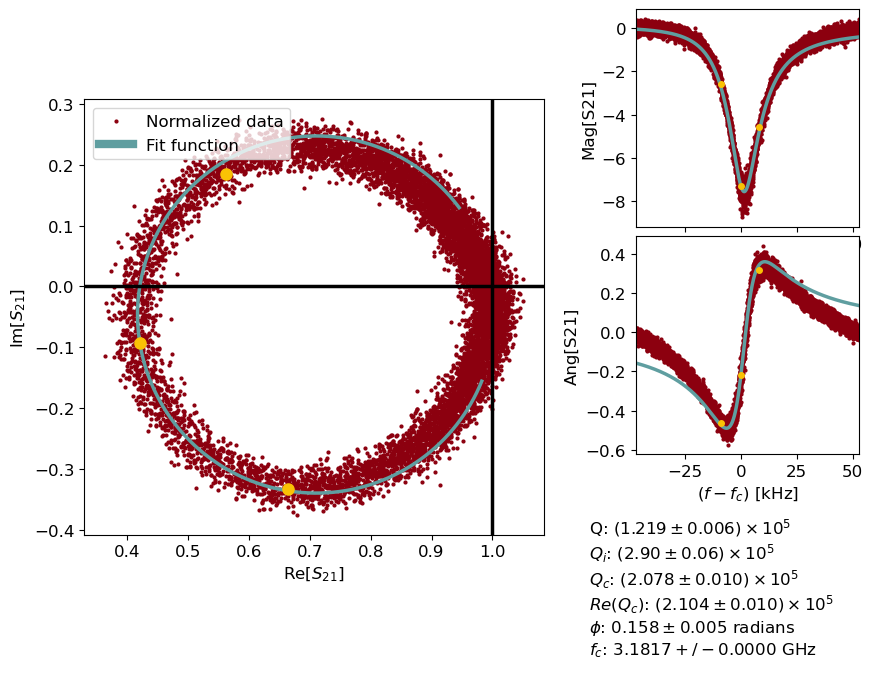

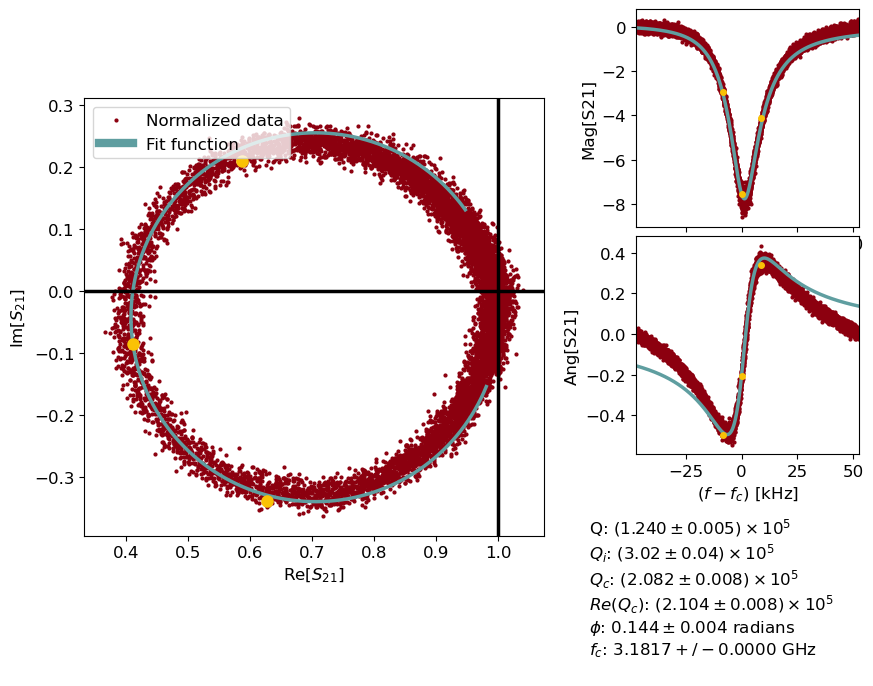

...

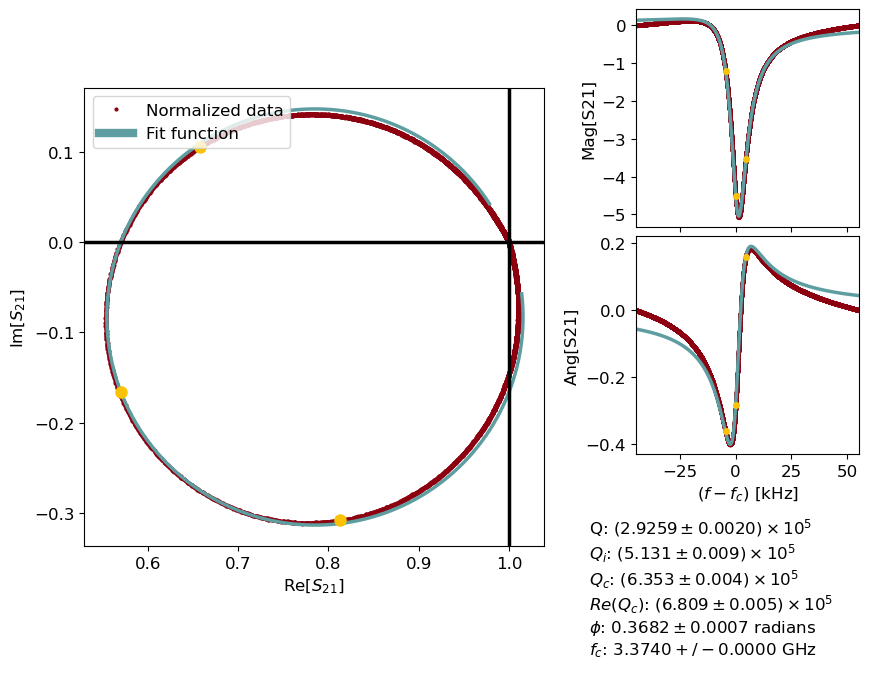

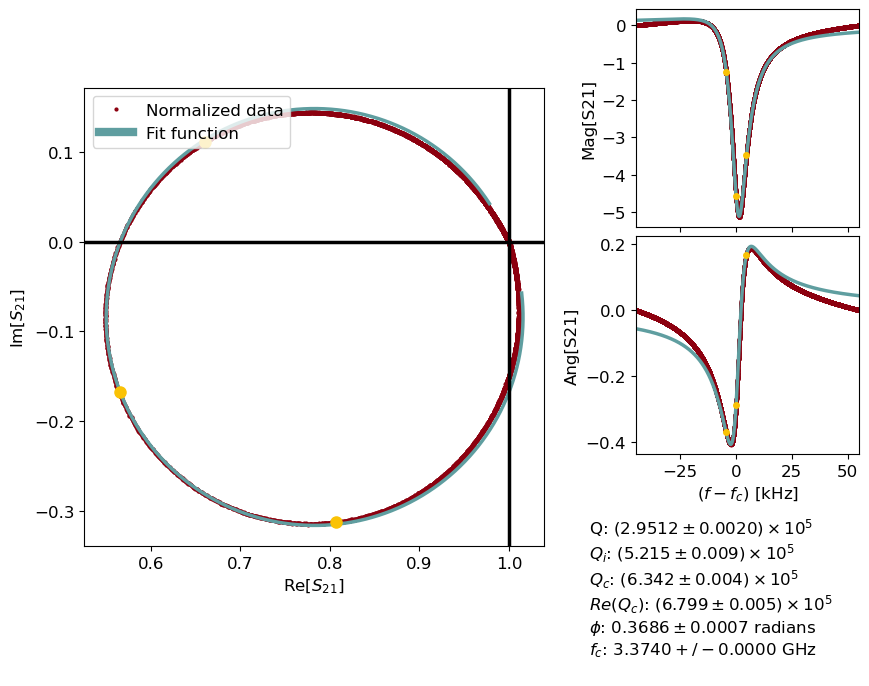

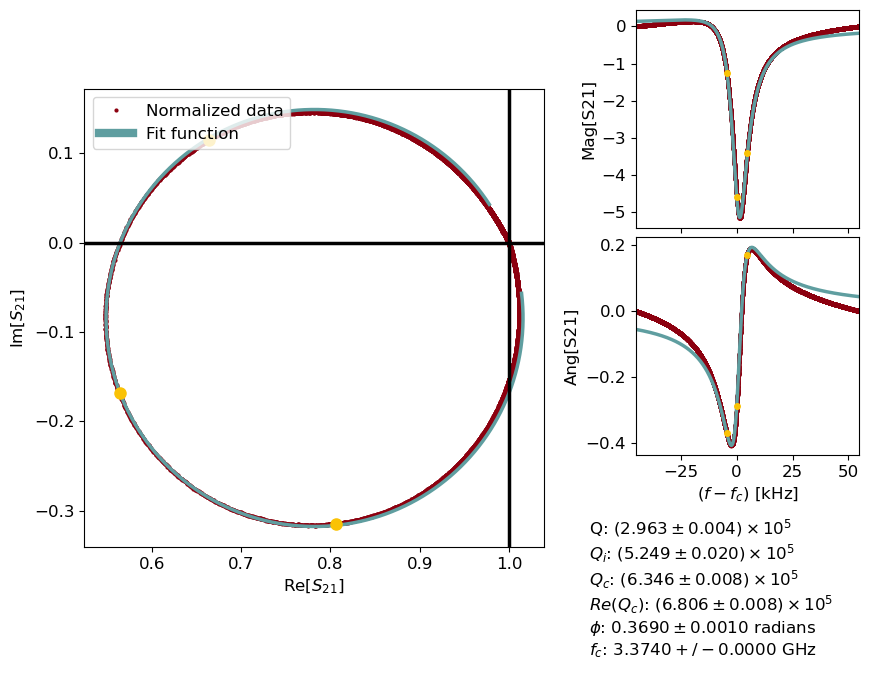

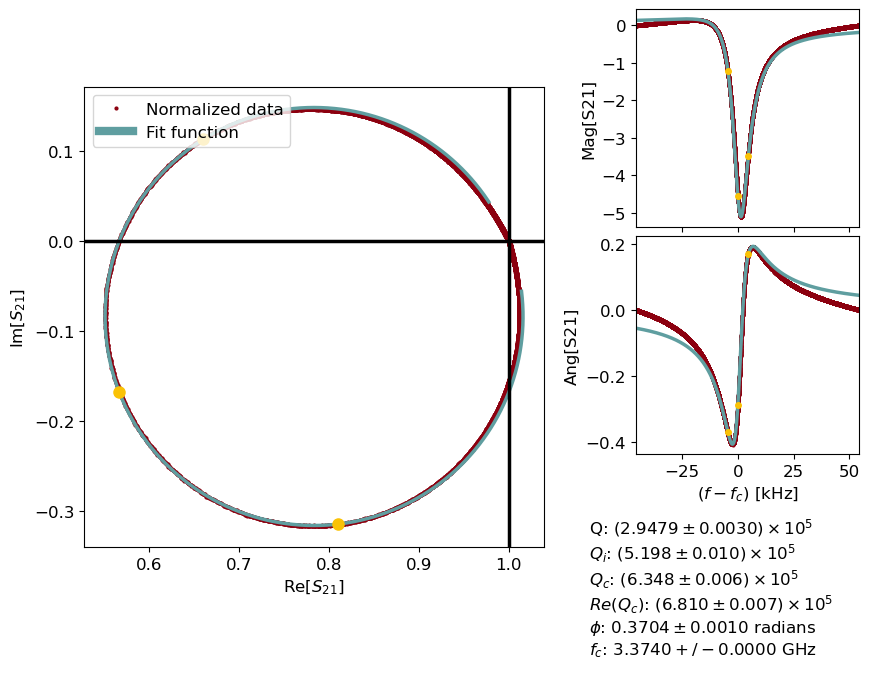

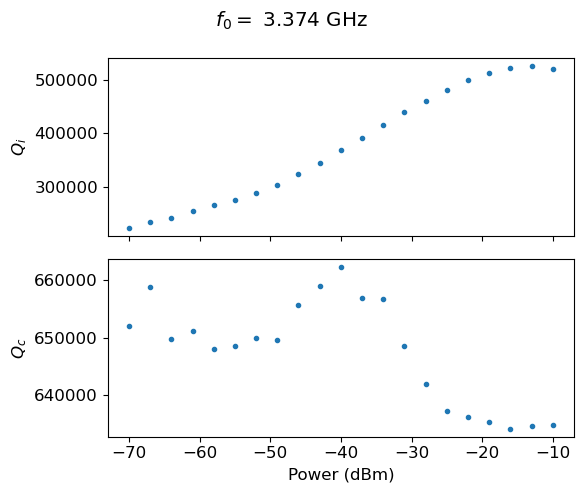

In [225]:
output_path = './procdata_' + folder + '/'
#data = {'freqs':xdata*1e6, 'amps':20*np.log10(amp), 'phases':-phs_correct} 

qi_list=[]
qc_list=[]
pow_list =[]
phs_list, freq_list, q_list, qi_phi_list = [], [], [], []
import time 
start = time.time()
for j in range(len(resonators)):
#for j in range(1):
    pattern = 'res_{:d}_'.format(resonators[j]) + '\d{2}dbm'
    file_list = [file for file in file_list0 if re.search(pattern, file)]
    file_list.sort()
    file_list = file_list[::-1]

    print(file_list)

    params, err, power = [], [], []
    for i in range(len(file_list)):
        data, attrs = prev_data(pth, file_list[i])

        data['phases'] = np.unwrap(data['phases'][0])
        data['freqs']=data['fpts'][0]
        data['amps']=data['mags'][0]

        #plt.figure()
        #plt.plot(data['freqs'], data['phases'], '.')
        #plt.plot(data['freqs'], data['amps'], '.')
        pow_curr = data['vna_power'][0]
        if pow_curr < -80: 
            continue
        power.append(data['vna_power'][0])
        #print(file_list[i])
        try:
            #print(power[-1])
            output = fit_resonator(data, file_list[i], output_path, 'DCM')    
            params.append(output[0])
            err.append(output[1])

        except: 
            print('fit failed')
            params.append([np.nan,np.nan,np.nan,np.nan])
            err.append([np.nan,np.nan,np.nan,np.nan, np.nan, np.nan])

    power=np.array(power)
    q = np.array([params[i][0] for i in range(len(params))])
    qc = np.array([params[i][1] for i in range(len(params))])
    freq = np.array([params[i][2] for i in range(len(params))])
    phase = np.array([params[i][3] for i in range(len(params))])
    inds = power >= -70

    Qc_comp = qc / np.exp(1j * phase)
    Qi = (q ** -1 - np.real(Qc_comp ** -1)) ** -1
    

    qi_phi = 1/(1/q-1/qc)
    qi_list.append(Qi)
    qi_phi_list.append(qi_phi)
    q_list.append(q)
    qc_list.append(qc)
    pow_list.append(power)
    phs_list.append(phase)
    freq_list.append(freq)
    end = time.time()
    print('Time elapsed: ', end-start)

    fig, ax = plt.subplots(2,1, figsize=(6,5), sharex=True)
    ax[0].plot(power[inds], Qi[inds], '.', markersize=6)
    ax[0].set_ylabel('$Q_i$')
    ax[1].plot(power[inds], qc[inds], '.', markersize=6)
    ax[1].set_ylabel('$Q_c$')
    ax[1].set_xlabel('Power (dBm)')
    fig.suptitle('$f_0 = $ {:3.3f} GHz'.format(freq[0]/1e9))
    fig.tight_layout()
    plt.savefig('/Users/sph/' + 'resonator_power_' + str(resonators[j]) + '.png', dpi=300)

In [226]:
file_list = [file for file in file_list0 if re.search(pattern, file)]

file_list.sort()
file_list = file_list[::-1]
file_list

['res_3374038_91dbm',
 'res_3374038_88dbm',
 'res_3374038_85dbm',
 'res_3374038_82dbm',
 'res_3374038_79dbm',
 'res_3374038_76dbm',
 'res_3374038_73dbm',
 'res_3374038_70dbm',
 'res_3374038_67dbm',
 'res_3374038_64dbm',
 'res_3374038_61dbm',
 'res_3374038_58dbm',
 'res_3374038_55dbm',
 'res_3374038_52dbm',
 'res_3374038_49dbm',
 'res_3374038_46dbm',
 'res_3374038_43dbm',
 'res_3374038_40dbm',
 'res_3374038_37dbm',
 'res_3374038_34dbm',
 'res_3374038_31dbm',
 'res_3374038_28dbm',
 'res_3374038_25dbm',
 'res_3374038_22dbm',
 'res_3374038_19dbm',
 'res_3374038_16dbm',
 'res_3374038_13dbm',
 'res_3374038_10dbm']

### Plot corrected data 

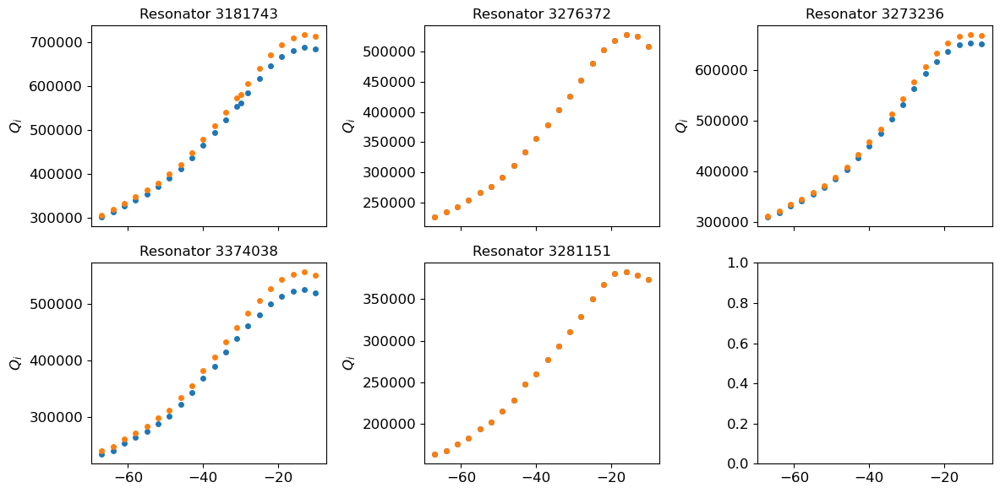

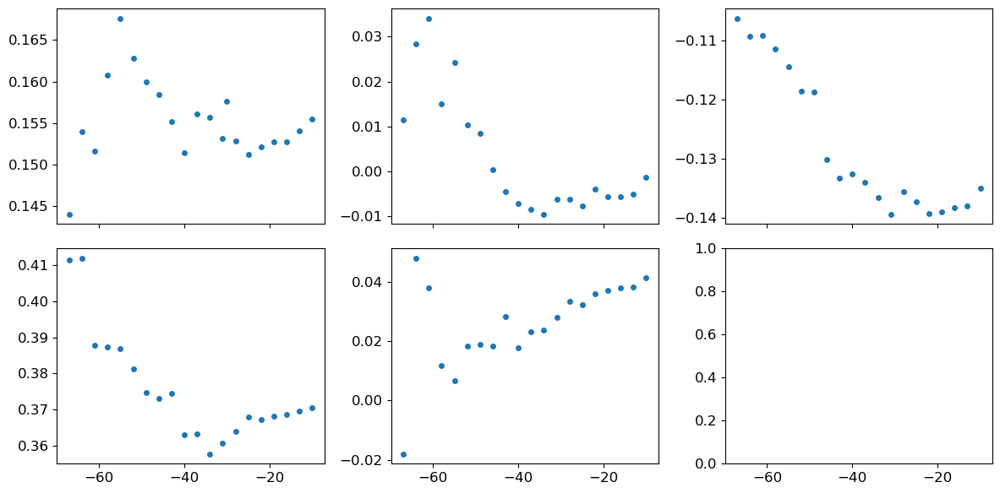

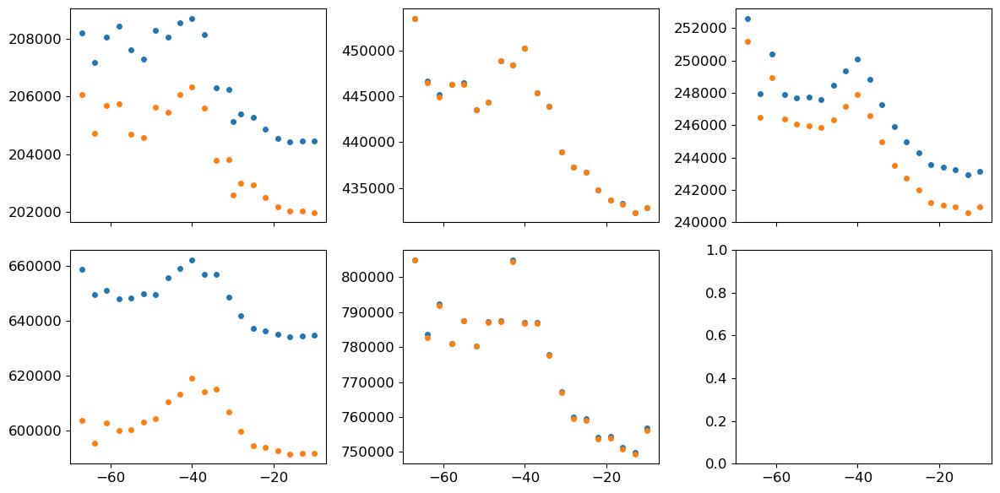

In [97]:
fig, ax = plt.subplots(2,3, figsize=(12,6), sharex=True)
ax = ax.flatten()

fig2, ax2 = plt.subplots(2,3, figsize=(12,6), sharex=True)
ax2 = ax2.flatten()

fig3, ax3 = plt.subplots(2,3, figsize=(12,6), sharex=True)
ax3 = ax3.flatten()

for i in range(len(resonators)):
    inds=pow_list[i]>-70
    ax[i].plot(pow_list[i][inds], qi_list[i][inds], 'o', markersize=4)
    ax[i].plot(pow_list[i][inds], qi_phi_list[i][inds], 'o', markersize=4)
    ax2[i].plot(pow_list[i][inds], phs_list[i][inds], 'o', markersize=4)
    ax[i].set_title('Resonator {:d}'.format(resonators[i]))
    #ax[i].set_xlabel('Power (dBm)')
    ax[i].set_ylabel('$Q_i$')
    ax3[i].plot(pow_list[i][inds], qc_list[i][inds], 'o', markersize=4)
    ax3[i].plot(pow_list[i][inds], np.real(qc_list[i][inds]*np.exp(-1j*phs_list[i][inds])), 'o', markersize=4)


fig.tight_layout()
fig2.tight_layout()
fig3.tight_layout()

In [232]:
i=4

import scipy.constants as cs
def tp(w, T): 
    return np.tanh(cs.h * w / (2 * cs.k * T ))

# def Qtls(n, T, w, Qtls0, b1, b2, D): 
#     return Qtls0 * np.sqrt(1 + n**b2 / (D*T**b1) * tp(w, T) / tp(w, T))

def pow_res(p): return 10**(p/10)*10**(-55/10)*1e-3

# def Qtls(n, T, w, Qtls0, b1, b2, D): 
#     return Qtls0 * np.sqrt(1 + n**b2 / (D*T**b1) * tp(w, T) / tp(w, T))


def Qtls(n, T, nc, f, Qtls0, beta): 
    return Qtls0/tp(2*np.pi*f, T)*np.sqrt(1+(n/nc)**beta*tp(2*np.pi*f, T))
pow_res(pow_list[i])[0]


print(pow_res(-70))

pow_res(-70)*120e3/(cs.h*3.5e9**2*2*np.pi)

pow_res(pow_list[i][0])*120e3/(cs.h*freq_list[i][0]**2*2*np.pi)

def n(p,  f, q): return pow_res(p)*q/(cs.h*f**2*2*np.pi)
def nn(p, q,qc, f): return 2*pow_res(p)*q**2/qc/(cs.h*f**2*2*np.pi)
nbar = n(pow_res(-10), freq_list[i][0], 120e3)
print(nbar)

nn(pow_list[i][0],120e3,200e3, freq_list[i][0])

3.1622776601683793e-16
8006556040.7337


120.95588231879758

### Error

In [53]:
#[Q_conf, Qi_conf, Qc_conf, Qc_Re_conf, phi_conf, w1_conf]
err

phi_conf= np.array([err[i][4] for i in range(len(err))])
q_conf = np.array([err[i][0] for i in range(len(err))])
qi_conf = np.array([err[i][1] for i in range(len(err))])
qc_conf = np.array([err[i][2] for i in range(len(err))])
qc_re_conf = np.array([err[i][3] for i in range(len(err))])
w1_conf = np.array([err[i][5] for i in range(len(err))])


[0.001  0.0013 0.0152 0.0084 0.0012 0.0019 0.0023 0.0205 0.0017 0.0013
 0.0014 0.0303 0.0015 0.0033 0.0015 0.0015 0.002  0.0045 0.0026 0.0014
 0.0118 0.0061 0.0011 0.0019]
[  6.8372   9.0195 221.4433 109.68    10.3118  20.5725  18.8415 318.1558
  11.6155  12.7663  10.3914 363.0478  15.3654  37.8479  10.1259  11.7101
  13.9169  54.2356  29.141   10.4665 159.9295  77.0622   7.8443  16.5252]
[  742.4089   995.978  12065.8691  6865.8273   925.8305  1510.9545
  1780.9077 16145.9536  1245.4735  1046.0238  1072.6401 27686.6296
  1199.4234  2564.5891  1120.2134  1149.8855  1499.7289  3594.2913
  2078.0793  1056.4185  9620.796   4815.3662   850.9024  1492.8974]
[ 805.8354 1002.905  3252.2629 2085.0751  487.4673  626.4712 1133.349
 4022.6614 1335.608   504.8302  914.2466 6156.959   534.1541  932.4858
 1189.3695  805.5279 1559.7406 1215.4463  807.7474  817.3501 2694.1902
 1552.8273  796.0797  864.8849]


### Single Resonator

res_3181743_61dbm


-61.0

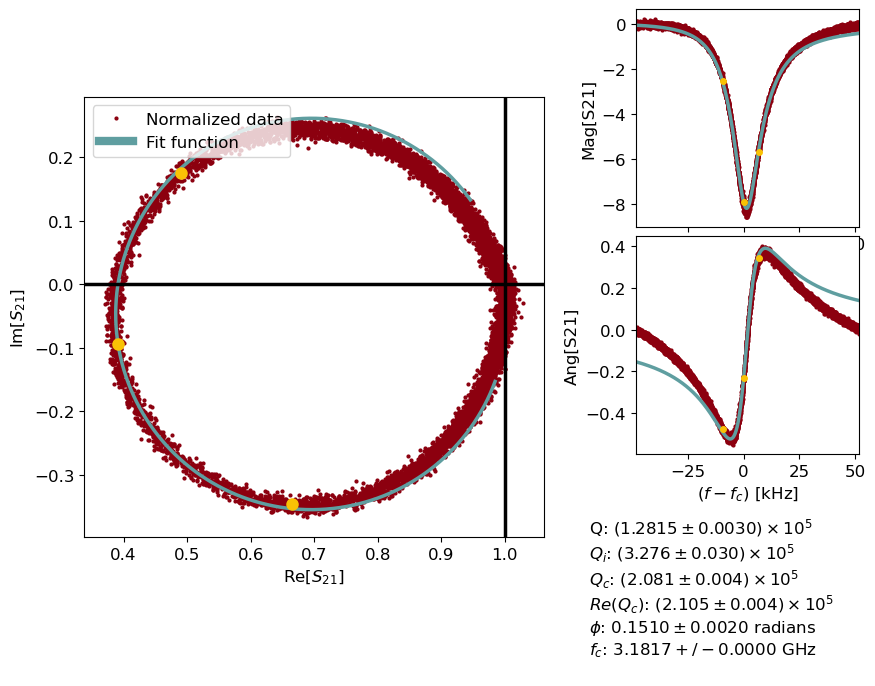

<Figure size 1000x800 with 0 Axes>

In [153]:
i=3
output_path = './procdata_' + folder + '/'

pattern = 'res_{:d}_'.format(resonators[0]) + '\d{2}dbm'
file_list = [file for file in file_list0 if re.search(pattern, file)]

data, attrs = prev_data(pth, file_list[i])

data['phases'] = np.unwrap(data['phases'][0])
data['freqs']=data['fpts'][0]
data['amps']=data['mags'][0]

print(file_list[i])
output = fit_resonator(data, file_list[i], output_path, 'DCM')    

plt.figure()
#plt.plot(data['freqs'], data['phases'], '.')
#plt.plot(data['freqs'], data['amps'], '.')
data['vna_power'][0]
#cpzm  226k / 736 [DOESN'T FIT WELL]
# phi 206 / 539
# DCM 206 / 523
# INv 202 / 520 

#QI

In [136]:
Qc = 200
eval = 10**(-8.3/20)
#1- Q/Qc = 0.4
# 1-0.4 =  Q/Qc
(1-eval)*Qc
Q = 120
1/(1/Q - 1/Qc)

300.0

## Plot resonator data

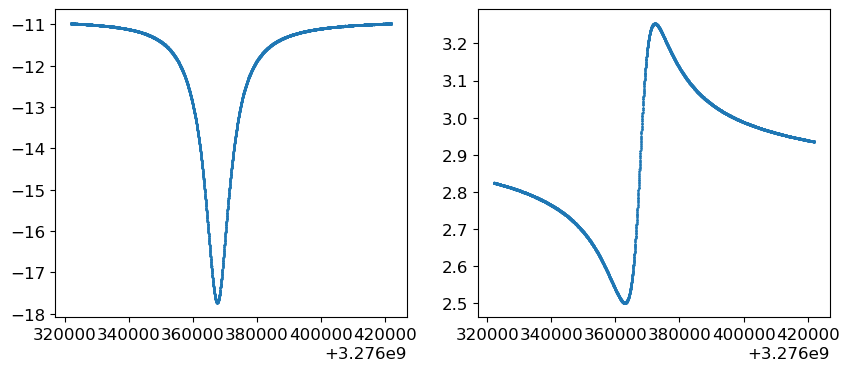

In [9]:
data = read_file(pth, file_list[20])
data['phases'] = np.unwrap(data['phases'])#*180/np.pi
fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].plot(data['freqs'], data['amps'],'.')
ax[1].plot(data['freqs'], data['phases'],'.')

## RFSoC processing including phase correction

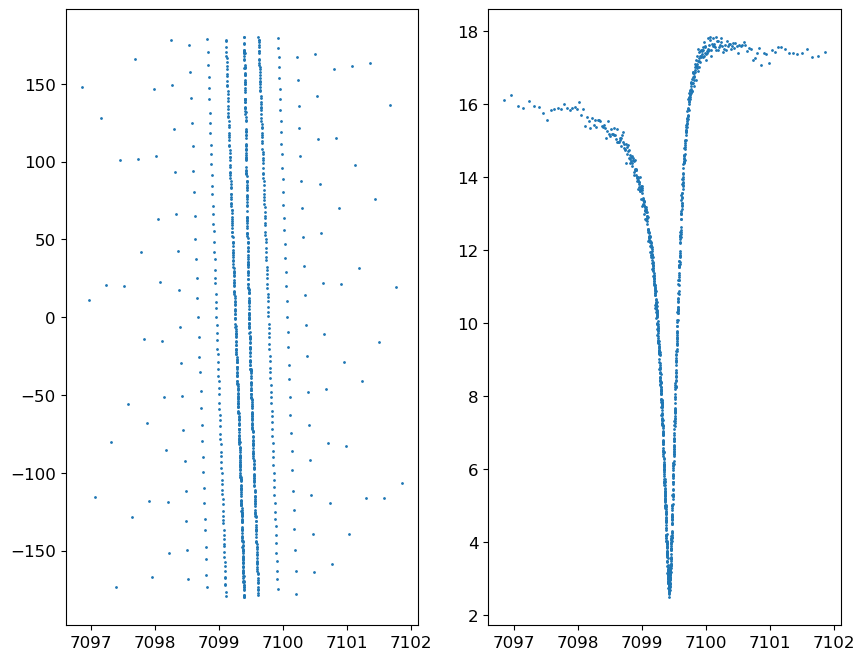

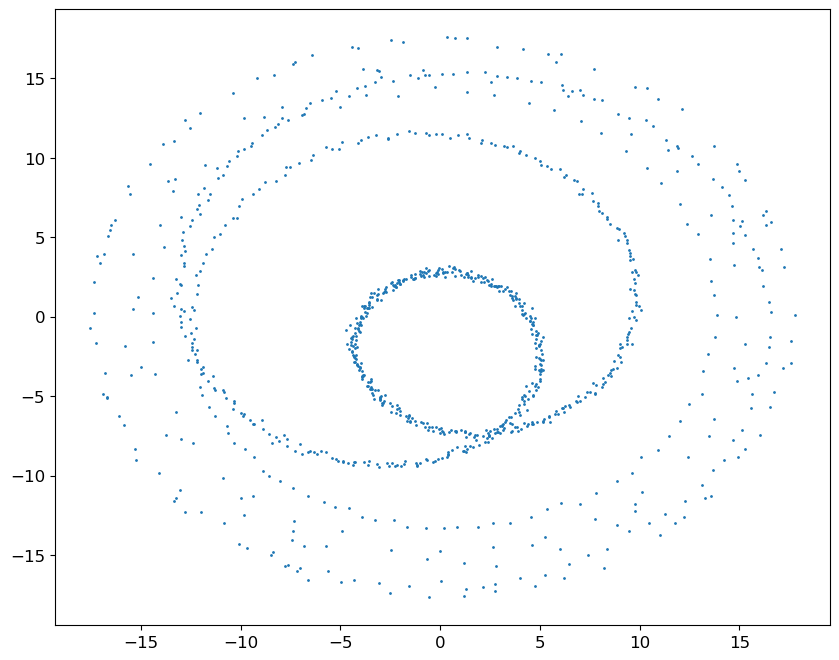

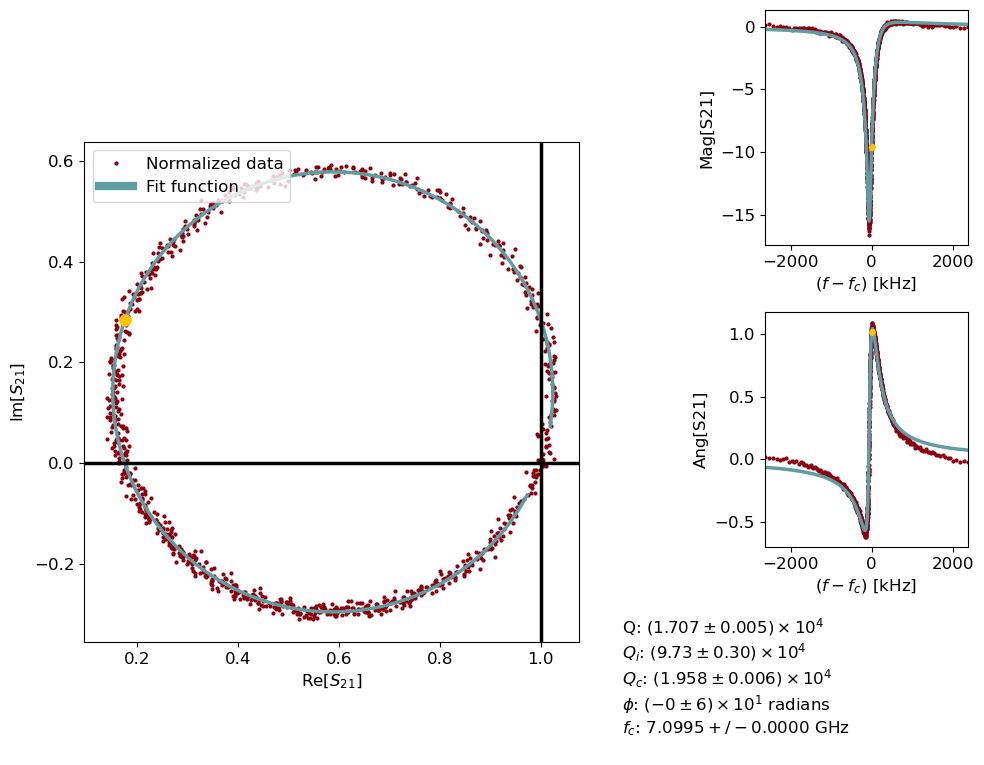

In [29]:
pth = '/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/Other computers/BF5 Measurement Computer /_Data/LLqub2/Tuning_2024_05_12/'
file = h5py.File(pth + '00000_resonator_spectroscopy_res0.h5', 'r')

fix_phase = False

xdata = file['xpts'][:]
phs2 = file['phases'][:]
amp = file['amps'][:]
#phs = np.unwrap(phs2)
phs = phs2
#plt.plot(xdata, phs)

# Assuming your data is stored in the variable fitdatax
# and you want to fit the first fract of the data

# Get the indices for the first fract of the data
if fix_phase: 
    num_points = len(xdata)
    span=np.max(xdata)-np.min(xdata)
    fract = np.argmin(np.abs(xdata-xdata[0]-span/3))

    indices = xdata[:fract]

    # Fit a line to the selected data points
    fit_params = np.polyfit(xdata[:fract], phs[:fract], 1)
    line = np.polyval(fit_params, xdata)

    fig, ax = plt.subplots(1, 1) 
    ax.plot(xdata, phs, '.-', markersize=2)
    ax.plot(xdata[:fract], line[:fract])

    # Subtract the line from the original data
    phs_correct = phs - line
else:
    phs_correct = phs

phs_dg = phs_correct*180/np.pi

fig, ax = plt.subplots(1, 2) 
ax[0].plot(xdata, phs_dg, '.', markersize=2)
ax[1].plot(xdata, amp, '.', markersize=2)

fig, ax = plt.subplots(1, 1)
ax.plot(amp*np.cos(phs_correct),amp*np.sin(phs_correct), '.', markersize=2)
#ax[0].plot(xdata, amp*np.cos(phs_correct), '.', markersize=2)
#ax[1].plot(xdata, amp*np.sin(phs_correct), '.', markersize=2)

data = {'freqs':xdata*1e6, 'amps':20*np.log10(amp), 'phases':-phs_correct} 
output = fit_resonator(data, 'res0', './rfsoc', 'DCM')

# Store the phase in degrees, the amplitude in dB, and the frequency in Hz
#pd_dict = {'xdata':xdata*1e6,'amp':20*np.log10(amp), 'phs':-phs_dg}
#pth = '/Users/sph/Library/CloudStorage/GoogleDrive-spharvey3@gmail.com/My Drive/Schuster/Code/Git/'
#pd.DataFrame(pd_dict).to_csv(pth + 'res_spec8.csv',header=False, index=False)

## Loop for processing  R+S data (npz files)

[]


IndexError: index 0 is out of bounds for axis 0 with size 0

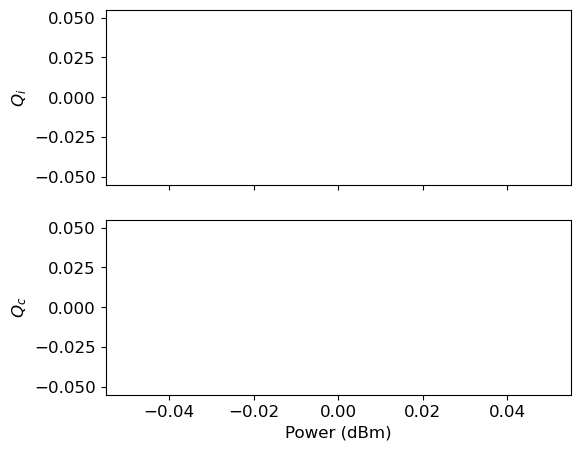

In [16]:
output_path = './procdata_240514/'


#for j in range(len(resonators)):
for j in range(1):
    #pattern = '_res_{:d}_'.format(tokens[j]) + '\d{2}dbm.npz'
    pattern = '_res_{:d}_'.format(resonators[j]) + '\d{2}dbm.npz'
    file_list = [file for file in file_list0 if re.search(pattern, file)]
    print(file_list)

    params, err, power = [], [], []
    for i in range(len(file_list)):
        data = read_file(pth, file_list[i])
        data['phases'] = np.unwrap(data['phases'])
        power.append(data['power_at_device'])
        print(file_list[i])
        try:
            output = fit_resonator(data, file_list[i][1:-4], output_path)    
            params.append(output[0])
            err.append(output[1])
        except: 
            print('fit failed')
            params.append([np.nan,np.nan,np.nan,np.nan])
            err.append([np.nan,np.nan,np.nan,np.nan, np.nan, np.nan])

    power=np.array(power)
    q = np.array([params[i][0] for i in range(len(params))])
    qc = np.array([params[i][1] for i in range(len(params))])
    freq = np.array([params[i][2] for i in range(len(params))])
    phase = np.array([params[i][3] for i in range(len(params))])
    inds = power > -150

    fig, ax = plt.subplots(2,1, figsize=(6,5), sharex=True)
    ax[0].plot(power[inds], 1/(1/q[inds]-1/qc[inds]), '.', markersize=6)
    ax[0].set_ylabel('$Q_i$')
    ax[1].plot(power[inds], qc[inds], '.', markersize=6)
    ax[1].set_ylabel('$Q_c$')
    ax[1].set_xlabel('Power (dBm)')
    fig.suptitle('$f_0 = $ {:3.3f} GHz'.format(freq[0]/1e9))
    fig.tight_layout()
    plt.savefig('/Users/sph/' + 'resonator_power' + str(tokens[j]) + '.png', dpi=300)



### Import Andrew's analysis 

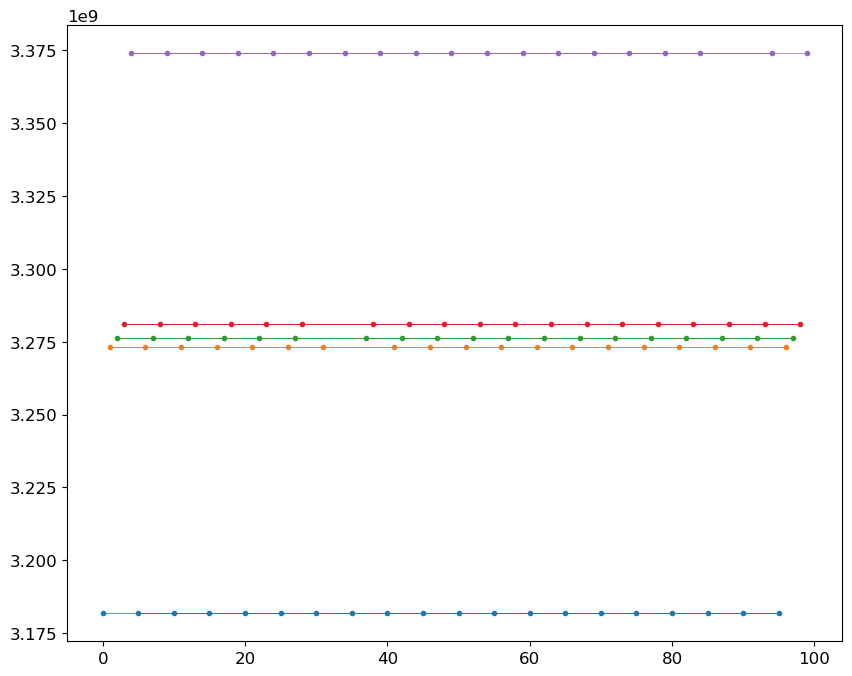

In [63]:
import pandas as pd

pth = '/users/sph/Downloads/data_revised.csv'

df = pd.read_csv(pth)
df['Q']=1/(1/df['Qi']+1/df['Qc'])
df.sort_values(by='freq_center', inplace=True)

plt.figure()

plt.plot(df['freq_center'][0:20],'.-', linewidth=0.5, markersize=6)
plt.plot(df['freq_center'][21:40],'.-', linewidth=0.5, markersize=6)
plt.plot(df['freq_center'][41:60],'.-', linewidth=0.5, markersize=6)
plt.plot(df['freq_center'][61:80],'.-', linewidth=0.5, markersize=6)
plt.plot(df['freq_center'][81:100],'.-', linewidth=0.5, markersize=6)

df1 = df[0:20]
df2 = df[21:40]
df3 = df[41:60]
df4 = df[61:80]
df5 = df[81:100]


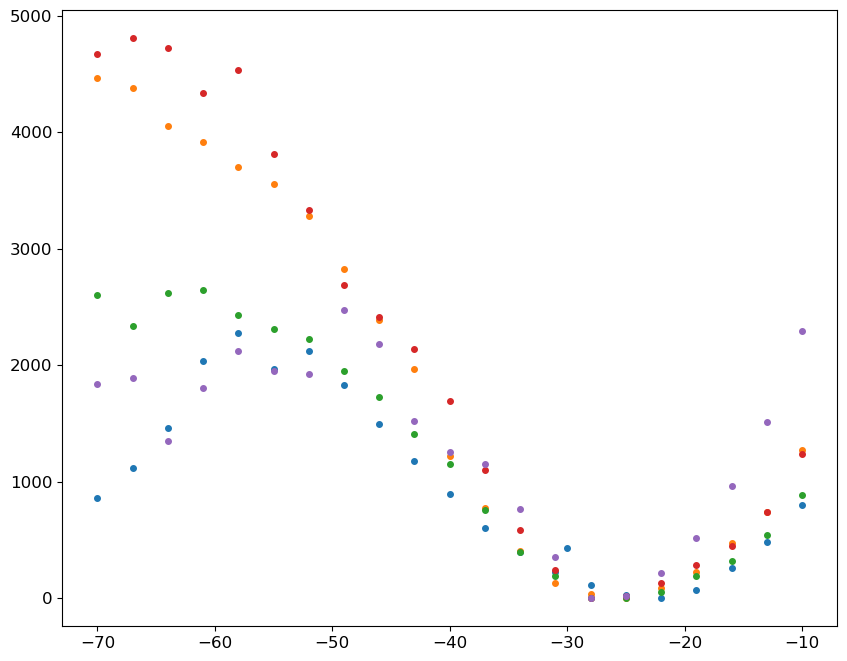

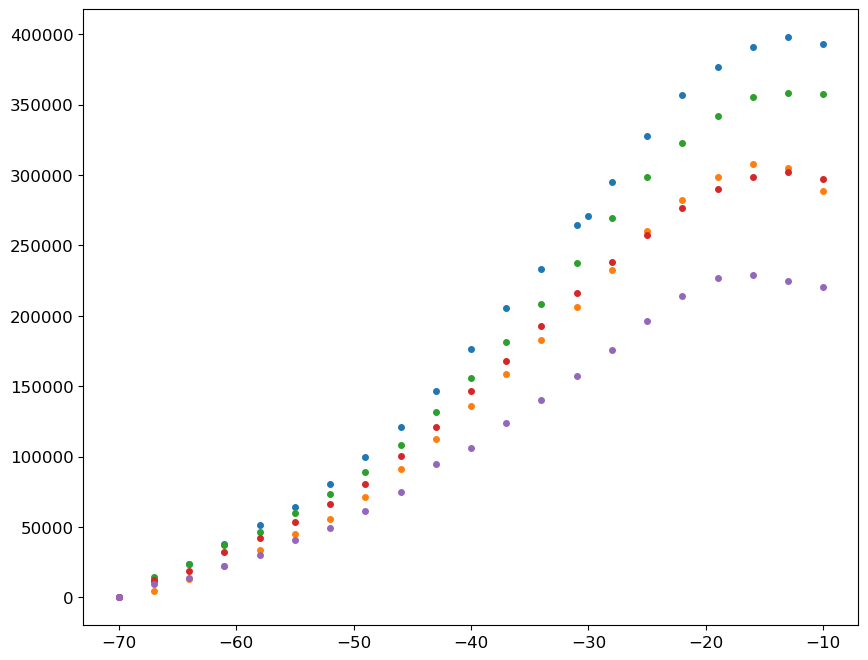

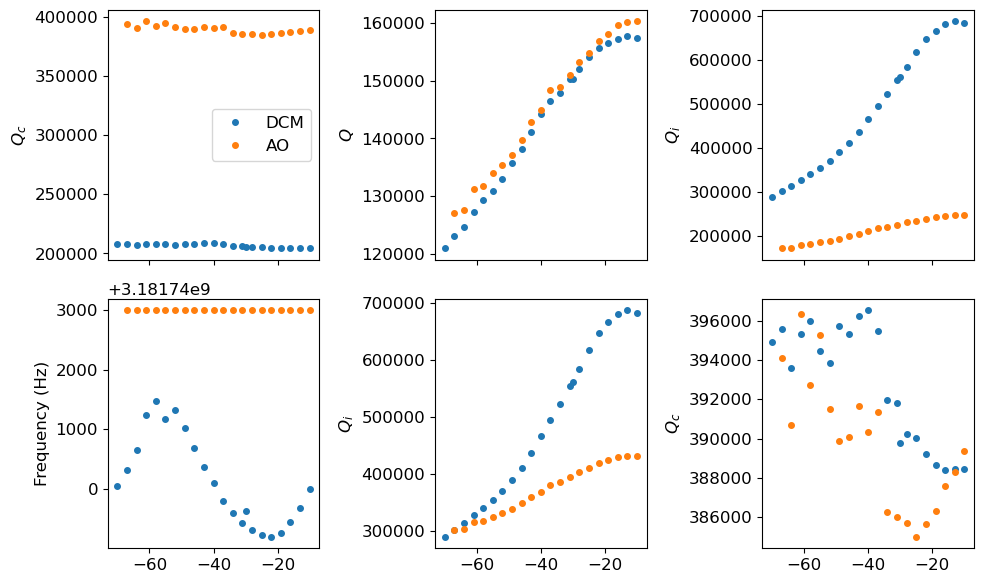

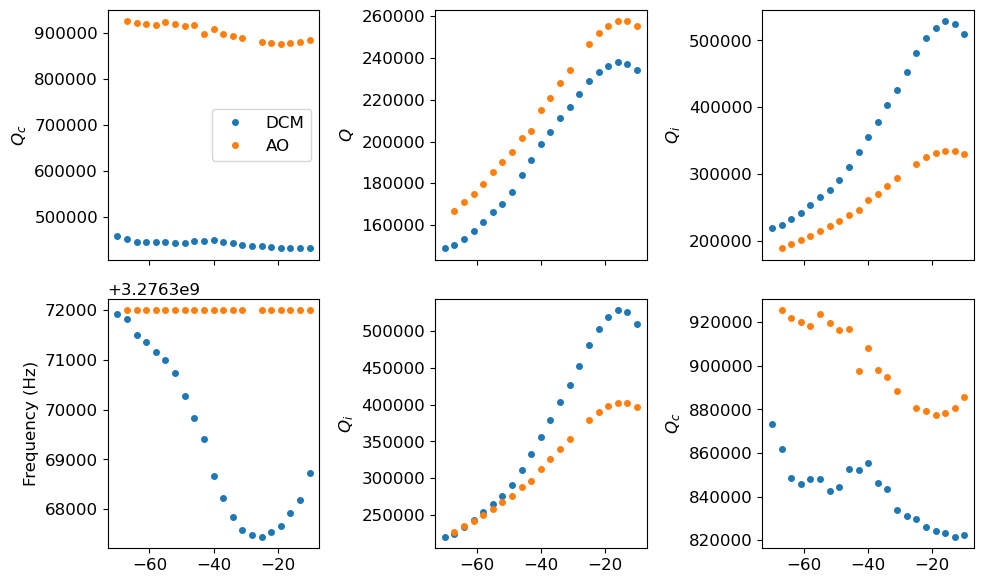

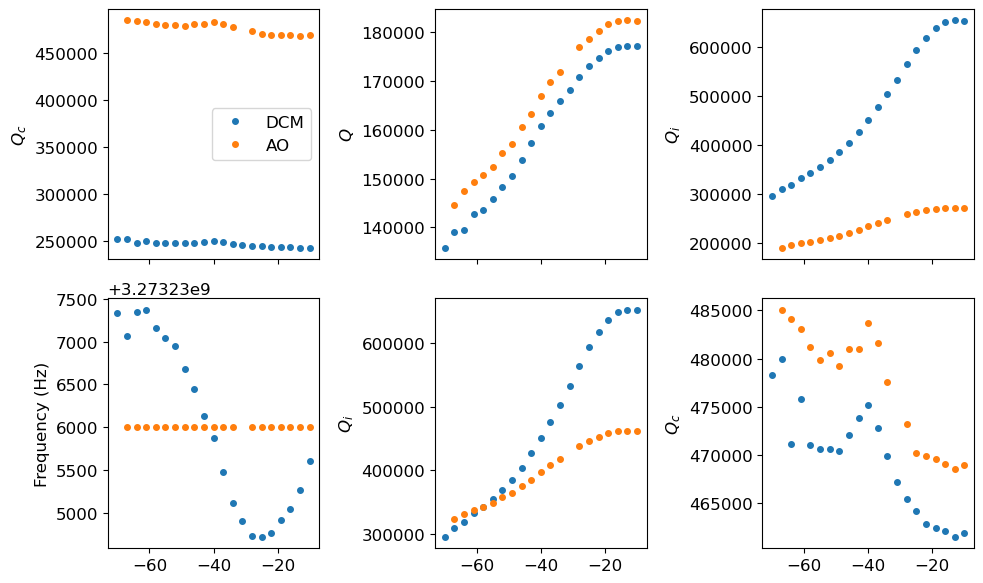

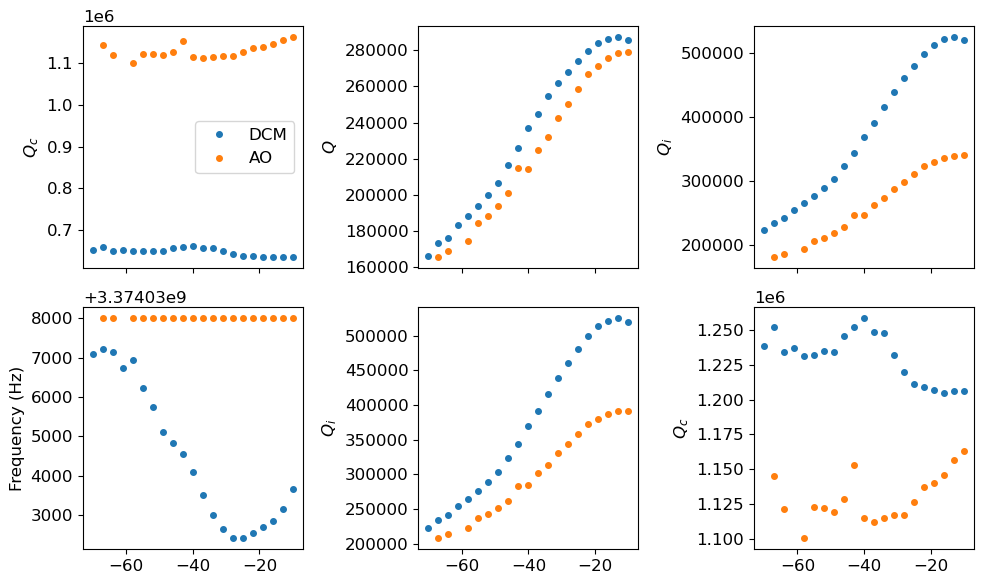

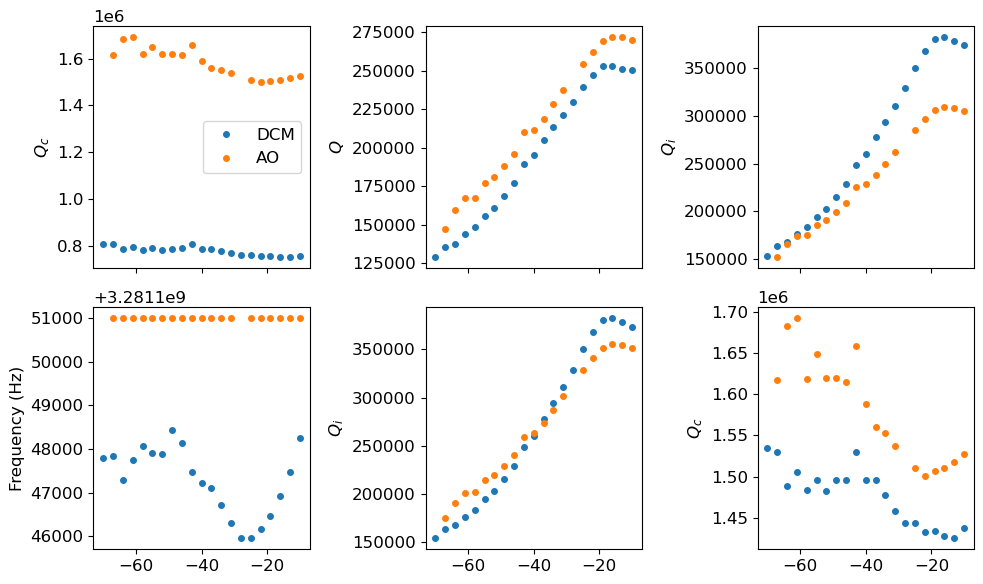

In [196]:
df_list =[]
df_list.append(df[0:20])
df_list.append(df[21:40])
df_list.append(df[41:60])
df_list.append(df[61:80])
df_list.append(df[81:100])

coef = [1.75, 1.2, 1.7, 1.15, 1.15]
figf, axf = plt.subplots(1,1)
figq, axq = plt.subplots(1,1)

i=0
for i in range(5): 
    fig, ax = plt.subplots(2, 3, sharex=True, figsize=(10,6))
    ax = ax.flatten()
    inds = pow_list[i]>=-70
    ax[0].plot(pow_list[i][inds], qc_list[i][inds], 'o', markersize=4, label='DCM')
    ax[0].plot(df_list[i]['power'],df_list[i]['Qc'],'o', markersize=4, label='AO')
    ax[0].legend()
    q = 1/(1/qi_list[i]+1/qc_list[i])

    ax[1].plot(pow_list[i][inds], q[inds], 'o', markersize=4)
    ax[1].plot(df_list[i]['power'],1.06*df_list[i]['Q'],'o', markersize=4)

    ax[2].plot(pow_list[i][inds], qi_list[i][inds], 'o', markersize=4)
    ax[2].plot(df_list[i]['power'],df_list[i]['Qi'],'o', markersize=4)

    ax[4].plot(pow_list[i][inds], qi_list[i][inds], 'o', markersize=4)
    ax[4].plot(df_list[i]['power'], coef[i]*df_list[i]['Qi'],'o', markersize=4)

    ax[5].plot(pow_list[i][inds], 1.9*qc_list[i][inds], 'o', markersize=4)
    ax[5].plot(df_list[i]['power'], df_list[i]['Qc'],'o', markersize=4)

    ax[3].plot(pow_list[i][inds], freq_list[i][inds], 'o', markersize=4)
    ax[3].plot(df_list[i]['power'],df_list[i]['freq_center'],'o', markersize=4)
    ax[0].set_ylabel('$Q_c$')
    ax[1].set_ylabel('$Q$') 
    ax[2].set_ylabel('$Q_i$')
    ax[3].set_ylabel('Frequency (Hz)')
    ax[4].set_ylabel('$Q_i$')
    ax[5].set_ylabel('$Q_c$')
    fig.tight_layout()

    axf.plot(pow_list[i][inds], freq_list[i][inds]-np.min(freq_list[i][inds]), 'o', markersize=4)
    axq.plot(pow_list[i][inds], qi_list[i][inds]-np.min(qi_list[i][inds]), 'o', markersize=4)




/var/folders/00/4dhzg6ms0xl3w8qywb_l4_nw0000gn/T/ipykernel_12208/693412827.py:13: RuntimeWarning: invalid value encountered in power
  return Qtls0/tp(2*np.pi*f, T)*np.sqrt(1+(n/nc)**beta*tp(2*np.pi*f, T))
/var/folders/00/4dhzg6ms0xl3w8qywb_l4_nw0000gn/T/ipykernel_12208/693412827.py:13: RuntimeWarning: invalid value encountered in sqrt
  return Qtls0/tp(2*np.pi*f, T)*np.sqrt(1+(n/nc)**beta*tp(2*np.pi*f, T))


[     0.0302   1284.7107 206589.5936      0.1974]


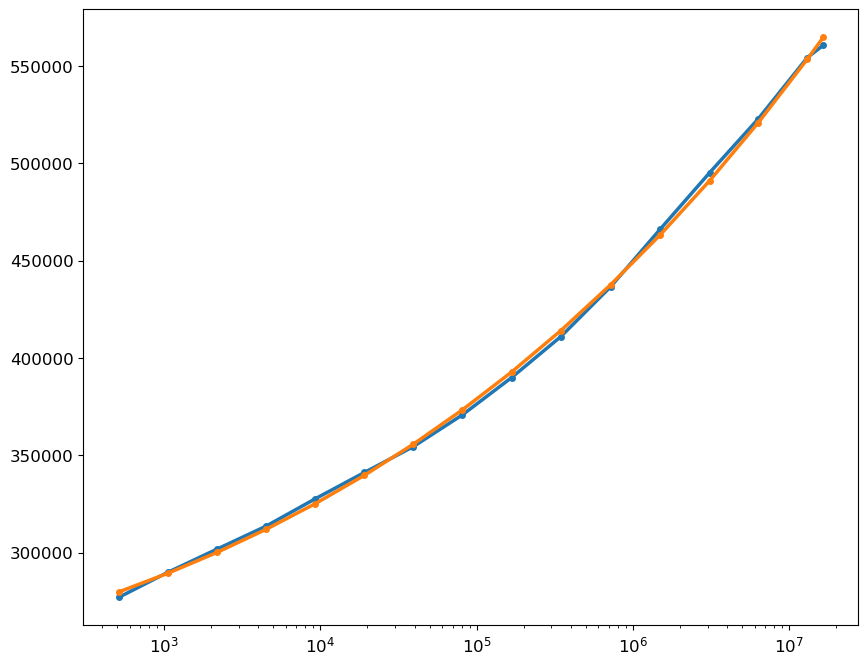

In [269]:
from scipy.optimize import curve_fit
q = 1/(1/qi_list[i]+1/qc_list[i])
i=0
#def Qtls(n, T, nc, f, Qtls0, beta): 
plt.figure()
inds = np.arange(2,18)
pow=nn(pow_list[i][inds], q[inds], qc_list[i][inds], freq_list[i][inds])
plt.semilogx(pow, qi_list[i][inds], 'o-', markersize=4)
#p, cov = curve_fit(Qtls, pow, qi_list[i][inds], [2e5, ])
p=[0.08, 1e4, 3e5, 0.3]
f = freq_list[i][0]
def Qtls(n, T, nc, Qtls0, beta): 
    return Qtls0/tp(2*np.pi*f, T)*np.sqrt(1+(n/nc)**beta*tp(2*np.pi*f, T))
pow_res(pow_list[i])[0]
p, cov = curve_fit(Qtls, pow, qi_list[i][inds], p)

plt.semilogx(pow, Qtls(pow, *p), 'o-', markersize=4)
print(p)

In [243]:
#nn(pow_list[i][inds], q[inds], qc_list[i][inds], freq_list[i][inds])

nn(pow_list[i][inds],120e3,200e3, freq_list[i][0])

array([1.0804e+03, 2.1557e+03, 4.3013e+03, 8.5822e+03, 1.7124e+04,
       3.4166e+04, 6.8171e+04, 1.3602e+05, 2.7139e+05, 5.4150e+05,
       1.0804e+06, 2.1557e+06, 4.3013e+06, 8.5822e+06, 1.0804e+07,
       1.7124e+07, 3.4166e+07, 6.8171e+07, 1.3602e+08, 2.7139e+08,
       5.4150e+08, 1.0804e+09])

In [245]:
nn(pow_list[i][0],120e3,200e3, freq_list[i][0])

136.01821386173728

In [247]:
q**2/qc_list[i]

array([ 63461.1587,  63017.5229,  68015.8469,  70507.9589,  72911.0566,
        75121.2374,  77836.066 ,  80314.7705,  82552.3515,  85270.4774,
        88495.5936,  91713.837 ,  95509.5053,  99589.5062, 103174.7579,
       106084.8809, 109561.3854, 109962.0963, 112485.2285, 115616.2007,
       118143.079 , 119790.5495, 120935.5022, 121493.0755, 121110.3438])

In [151]:
qc_mean = np.array([np.mean(qc_list[i]) for i in range(len(qc_list))])
freq_mean = np.array([np.mean(freq_list[i]) for i in range(len(freq_list))])
qc_mean2 = np.array([np.mean(df_list[i]['Qc']) for i in range(len(df_list))])
qi_0 = np.array([np.min(qi_list[i][pow_list[i]>-70]) for i in range(len(qc_list))])


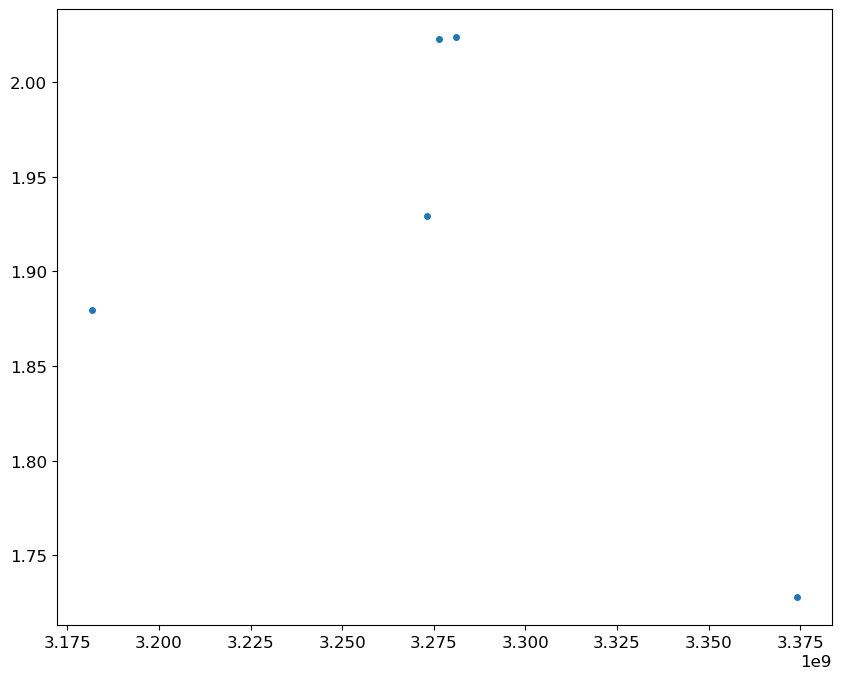

In [121]:
plt.figure)
plot_full = False
if plot_full:
    plt.plot(freq_mean, qc_mean, 'o', markersize=4, label='DCM')
    plt.plot(freq_mean, qc_mean2, 'o', markersize=4, label='AO')
else:
    plt.plot(freq_mean, qc_mean2/qc_mean, 'o', markersize=4, label='AO')